In [1]:
!git clone https://github.com/fastai/fastai

Cloning into 'fastai'...
remote: Enumerating objects: 53, done.
remote: Counting objects: 100% (53/53), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 19547 (delta 23), reused 31 (delta 14), pack-reused 19494
Receiving objects: 100% (19547/19547), 339.62 MiB | 28.47 MiB/s, done.
Resolving deltas: 100% (13401/13401), done.
Checking out files: 100% (738/738), done.


In [0]:
import os
os.chdir('fastai')

In [3]:
!tools/run-after-git-clone

Executing: git config --local include.path ../.gitconfig
Success: repo's .gitconfig is now trusted

Installing .git/hooks/post-merge to automatically trust examples and docs_src notebooks
Success



In [4]:
!pip install -e ".[dev]"

Obtaining file:///content/fastai
    100% |████████████████████████████████| 112kB 3.4MB/s 
    100% |████████████████████████████████| 23.3MB 1.9MB/s 
    100% |████████████████████████████████| 1.9MB 15.0MB/s 
    100% |████████████████████████████████| 591.8MB 26kB/s 
tcmalloc: large alloc 1073750016 bytes == 0x628fe000 @  0x7fcdf2dde2a4 0x591a07 0x5b5d56 0x502e9a 0x506859 0x502209 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x507641 0x502209 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x507641 0x504c28 0x502540 0x502f3d 0x507641
    100% |████████████████████████████████| 61kB 19.8MB/s 
    100% |████████████████████████████████| 20.9MB 1.8MB/s 
    100% |████████████████████████████████| 3.4MB 5.1MB/s 
    100% |████████████████████████████████| 9.0MB 1.9MB/s 
    100% |████████████████████████████████| 870kB 3.4MB/s 
    100% |████████████████████████████████| 471kB 8.2MB/s 
    100% |██████████████████████

In [0]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [0]:
from fastai.vision import *

In [0]:
path = untar_data(URLs.PETS)

In [0]:
path_img = path/'images'
fnames = get_image_files(path_img)
np.random.seed(2)
pat = re.compile(r'/([^/]+)_\d+.jpg$')
data = ImageDataBunch.from_name_re(path_img, fnames, pat, ds_tfms=get_transforms(), size=224, bs=64
                                  ).normalize(imagenet_stats)

In [0]:
#tfms = (rand_pad(2, 28), [])
#data = ImageDataBunch.from_folder(path, ds_tfms=get_transforms(), bs=128).normalize(imagenet_stats)

In [0]:

@dataclass
class cohen_kappa(Callback):
    "Computes the cohen kappa measure between preds and targets for binary-classification."
    num_clas:int=2

    
    def on_epoch_begin(self, **kwargs):
        self.sum_pred = torch.zeros(1,self.num_clas).float()
        self.sum_true = torch.zeros(1,self.num_clas).float()
        self.sum_false_pred = 0
        
    
    def on_batch_end(self, last_output, last_target, **kwargs):
        
        y_pred = last_output.argmax(dim=1).float()
        y_true = last_target.float()
        
        for i in range(self.num_clas):
            self.sum_pred[0,i] += (y_pred == i).float().sum()
            self.sum_true[0,i] += (y_true == i).float().sum()
        
        self.sum_false_pred += (y_pred != y_true).float().sum()
        
    
    def on_epoch_end(self, **kwargs):
        
        expected = torch.mm(self.sum_pred.view(self.num_clas,1), self.sum_true.view(1,self.num_clas)) / self.sum_pred.float().sum()
        mat_id = torch.matrix_power(torch.ones(self.num_clas,self.num_clas),0) # make identity matrix
        w_mat = torch.ones(self.num_clas,self.num_clas) - mat_id
        k = self.sum_false_pred / (w_mat * expected).sum()
        
        self.metric = 1 - k

In [11]:
learn = create_cnn(data, models.resnet34, metrics=[accuracy,Fbeta_binary(clas=0),cohen_kappa(num_clas=len(data.classes))])


Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.torch/models/resnet34-333f7ec4.pth
100%|██████████| 87306240/87306240 [00:01<00:00, 77682808.15it/s]


In [12]:
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,accuracy,fbeta_binary,cohen_kappa
1,1.422029,0.369593,0.889039,0.897436,0.885894
2,0.535446,0.282793,0.907307,0.937500,0.904682
3,0.328029,0.243423,0.917456,0.941558,0.915115
4,0.254506,0.241880,0.920839,0.993590,0.918590


In [0]:
learn.save('base_model')
learn.load('base_model');

In [14]:
learn.unfreeze()
learn.fit_one_cycle(2, max_lr=slice(1e-6,1e-4))

epoch,train_loss,valid_loss,accuracy,fbeta_binary,cohen_kappa
1,0.243138,0.235025,0.918809,0.941558,0.916499
2,0.214765,0.229512,0.924222,0.941558,0.922070


In [0]:
learn.save('unfreezed')

# Test viz

In [0]:
os.chdir('/content/')

In [0]:
def show_image(grads,original):
    # Normalize
    im = grads - grads.min()
    im /= im.max()
    
    if isinstance(im, np.ndarray):
        if len(im.shape) == 2:
            im = np.expand_dims(im, axis=0)
        if im.shape[0] == 1:
            # Converting an image with depth = 1 to depth = 3, repeating the same values
            # For some reason PIL complains when I want to save channel image as jpg without
            # additional format in the .save()
            im = np.repeat(im, 3, axis=0)
            # Convert to values to range 1-255 and W,H, D
        if im.shape[0] == 3:
            im = im.transpose(1, 2, 0) * 255
        im = Image.fromarray(im.astype(np.uint8))
    fig,ax = plt.subplots(1,2,figsize=(15,10))
    ax[0].imshow(im)
    ax[1].imshow(original)
    

In [0]:
os.chdir('/content')
!rm -r pytorch_viz

In [102]:
!git clone https://github.com/tdekelver/pytorch_viz.git
os.chdir('./pytorch_viz/viz_pytorch/src/')

Cloning into 'pytorch_viz'...
remote: Enumerating objects: 236, done.
remote: Counting objects: 100% (236/236), done.
remote: Compressing objects: 100% (175/175), done.
remote: Total 236 (delta 119), reused 178 (delta 61), pack-reused 0
Receiving objects: 100% (236/236), 28.32 MiB | 34.31 MiB/s, done.
Resolving deltas: 100% (119/119), done.


In [103]:
fnames[15]

PosixPath('/root/.fastai/data/oxford-iiit-pet/images/saint_bernard_40.jpg')

In [104]:
data.classes[30]

'saint_bernard'

In [0]:
from PIL import Image
from guided_backprop import *
from misc_functions import *

In [0]:
learn.load('unfreezed');

In [0]:
img_path = fnames[15]#f'{path}/train/3/10000.png'
original_image =Image.open(img_path).convert('RGB')
mean= [float(i) for i in data.norm.keywords['mean']]
std = [float(i) for i in data.norm.keywords['std']]
prep_img = preprocess_image(original_image,mean,std )
target_class = 30 #0
file_name_to_export = 'saint_bernard_40'
pretrained_model = copy.deepcopy(learn.model).cpu()

# Guided BackProp

In [0]:
# Guided backprop
GBP = GuidedBackprop(pretrained_model)
# Get gradients
guided_grads = GBP.generate_gradients(prep_img, target_class)
# Save colored gradients
#save_gradient_images(guided_grads, file_name_to_export + '_Guided_BP_color')
# Convert to grayscale
grayscale_guided_grads = convert_to_grayscale(guided_grads)
# Save grayscale gradients
#save_gradient_images(grayscale_guided_grads, file_name_to_export + '_Guided_BP_gray')
# Positive and negative saliency maps
pos_sal, neg_sal = get_positive_negative_saliency(guided_grads)

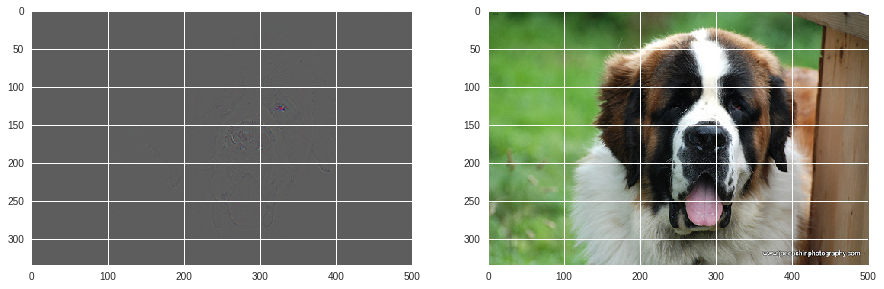

In [33]:
show_image(guided_grads,original_image)

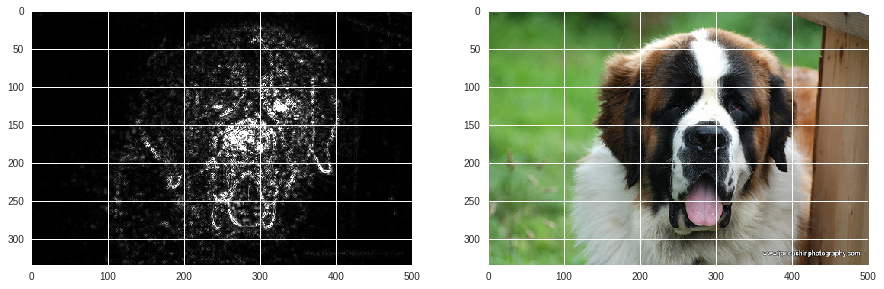

In [34]:
show_image(grayscale_guided_grads,original_image)

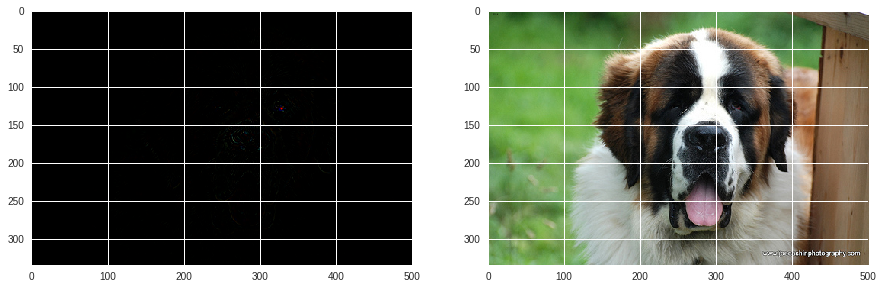

In [35]:
show_image(pos_sal,original_image)
  

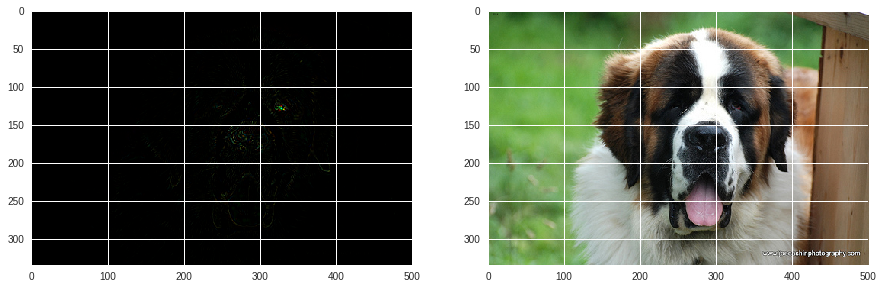

In [36]:
show_image(neg_sal,original_image)

# Vanilla Backprop

In [0]:
from vanilla_backprop import *


In [0]:
# Vanilla backprop
VBP = VanillaBackprop(pretrained_model)
# Generate gradients
vanilla_grads = VBP.generate_gradients(prep_img, target_class)
# Save colored gradients
#save_gradient_images(vanilla_grads, file_name_to_export + '_Vanilla_BP_color')
# Convert to grayscale
grayscale_vanilla_grads = convert_to_grayscale(vanilla_grads)

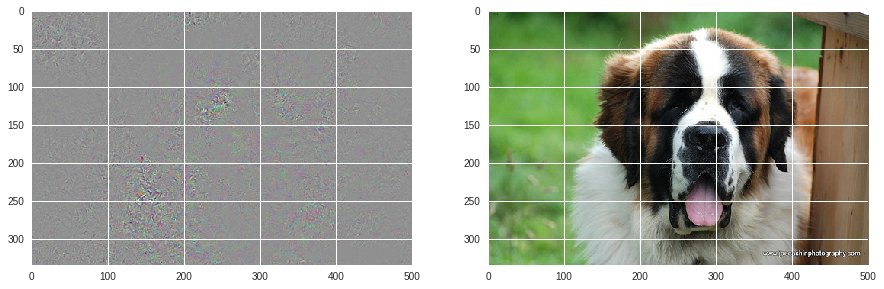

In [40]:
show_image(vanilla_grads,original_image)

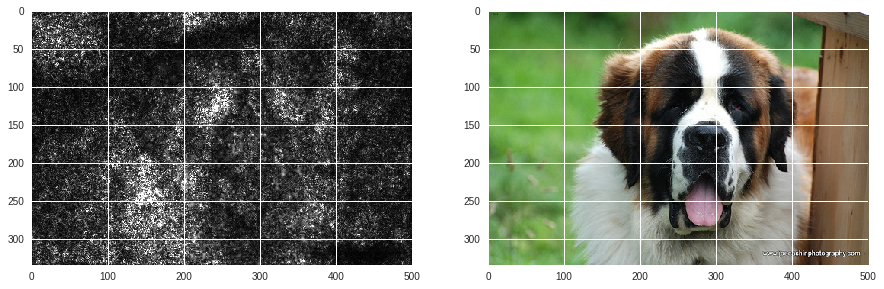

In [41]:
show_image(grayscale_vanilla_grads,original_image)

# Generate Random Target Image (not working)

In [0]:
from generate_class_specific_samples import *

In [132]:
target_class = 0  # Saint-Bernard
csig = ClassSpecificImageGeneration(pretrained_model, target_class,mean,std,lr =6,min_loss = -1000,name = 'st_bernard')
csig.generate()

Iteration: 0 Loss -0.49
Iteration: 25 Loss -3.25
Iteration: 50 Loss -3.10
Iteration: 75 Loss -2.66
Iteration: 100 Loss -3.24
Iteration: 125 Loss -2.97
Iteration: 150 Loss -3.51
Iteration: 175 Loss -3.05
Iteration: 200 Loss -2.96
Iteration: 225 Loss -3.33
Iteration: 250 Loss -3.86
Iteration: 275 Loss -2.62
Iteration: 300 Loss -3.39


KeyboardInterrupt: ignored

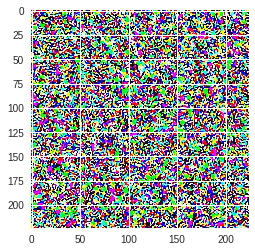

In [133]:
im = Image.open('../generated/st_bernard_iteration_300.jpg')
plt.imshow(im)

# Gradcam

In [0]:
from gradcam import *

In [50]:
# Grad cam
grad_cam = GradCam(pretrained_model, target_layer=113)
# Generate cam mask
cam = grad_cam.generate_cam(prep_img, target_class)
# Save mask
#save_class_activation_images(original_image, cam, file_name_to_export)
print('Grad cam completed')

Grad cam completed


In [0]:
# Grayscale activation map
heatmap, heatmap_on_image = apply_colormap_on_image(original_image, cam, 'hsv')

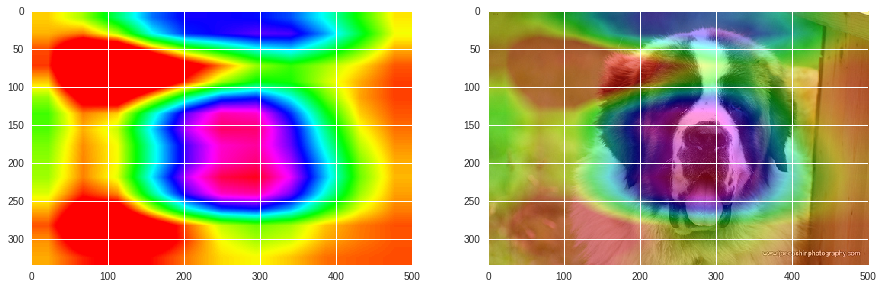

In [52]:
fig,ax = plt.subplots(1,2,figsize=(15,10))
ax[0].imshow(heatmap)
ax[1].imshow(heatmap_on_image)

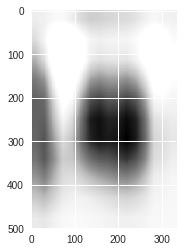

In [53]:
plt.imshow(cam)

# Guided Grad Cam

In [0]:
from guided_gradcam import *

In [56]:
# Grad cam
gcv2 = GradCam(pretrained_model, target_layer=113)
# Generate cam mask
cam = gcv2.generate_cam(prep_img, target_class)
print('Grad cam completed')

# Guided backprop
GBP = GuidedBackprop(pretrained_model)
# Get gradients
guided_grads = GBP.generate_gradients(prep_img, target_class)
print('Guided backpropagation completed')

# Guided Grad cam
cam_gb = guided_grad_cam(cam.transpose(1,0), guided_grads)
#save_gradient_images(cam_gb, file_name_to_export + '_GGrad_Cam')
grayscale_cam_gb = convert_to_grayscale(cam_gb)
#save_gradient_images(grayscale_cam_gb, file_name_to_export + '_GGrad_Cam_gray')
print('Guided grad cam completed')

Grad cam completed
Guided backpropagation completed
Guided grad cam completed


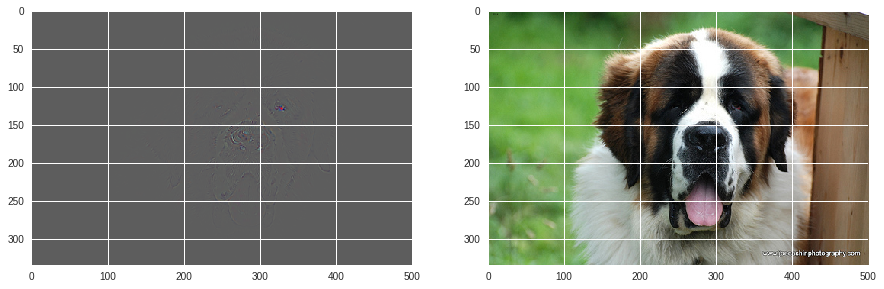

In [57]:
show_image(cam_gb,original_image)

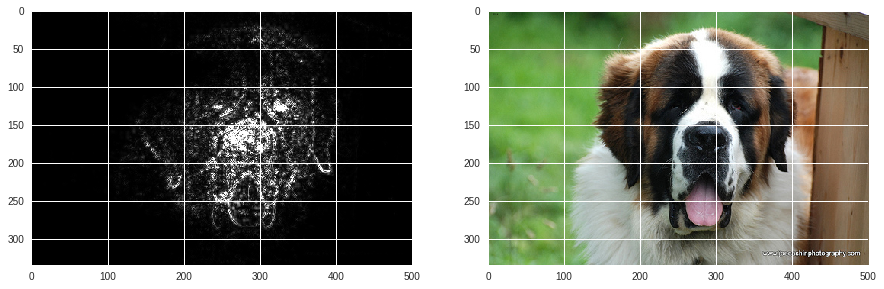

In [58]:
show_image(grayscale_cam_gb,original_image)

# Smooth Grad

In [0]:
from smooth_grad import *

In [61]:
VBP = VanillaBackprop(pretrained_model)
#GBP = GuidedBackprop(pretrained_model)  # if you want to use GBP dont forget to
# change the parametre in generate_smooth_grad

param_n = 50
param_sigma_multiplier = 5
smooth_grad = generate_smooth_grad(VBP,  # ^This parameter
                                   prep_img,
                                   target_class,
                                   param_n,
                                   param_sigma_multiplier)

# Save colored gradients
#save_gradient_images(smooth_grad, file_name_to_export + '_SmoothGrad_color')
# Convert to grayscale
grayscale_smooth_grad = convert_to_grayscale(smooth_grad)
# Save grayscale gradients
#save_gradient_images(grayscale_smooth_grad, file_name_to_export + '_SmoothGrad_gray')

Iteration 0 of 50 started
Iteration 10 of 50 started
Iteration 20 of 50 started
Iteration 30 of 50 started
Iteration 40 of 50 started


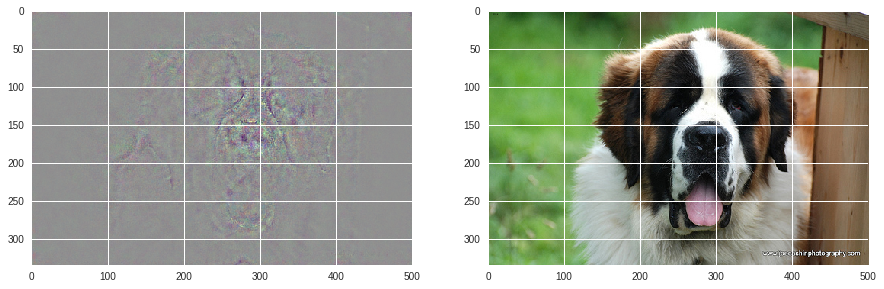

In [62]:
show_image(smooth_grad, original_image)

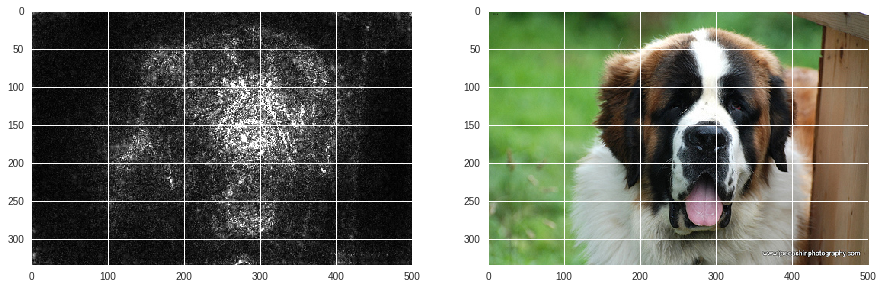

In [63]:
show_image(grayscale_smooth_grad, original_image)

In [65]:
results = {}
for i in range(1,12):
  print(i)
  pretrained_model = copy.deepcopy(learn.model).cpu()
  VBP = VanillaBackprop(pretrained_model) 
  param_n = 50
  param_sigma_multiplier = i
  smooth_grad = generate_smooth_grad(VBP,  # ^This parameter
                                     prep_img,
                                     target_class,
                                     param_n,
                                     param_sigma_multiplier)
  results[i] = smooth_grad

1
Iteration 0 of 50 started
Iteration 10 of 50 started
Iteration 20 of 50 started
Iteration 30 of 50 started
Iteration 40 of 50 started
2
Iteration 0 of 50 started
Iteration 10 of 50 started
Iteration 20 of 50 started
Iteration 30 of 50 started
Iteration 40 of 50 started
3
Iteration 0 of 50 started
Iteration 10 of 50 started
Iteration 20 of 50 started
Iteration 30 of 50 started
Iteration 40 of 50 started
4
Iteration 0 of 50 started
Iteration 10 of 50 started
Iteration 20 of 50 started
Iteration 30 of 50 started
Iteration 40 of 50 started
5
Iteration 0 of 50 started
Iteration 10 of 50 started
Iteration 20 of 50 started
Iteration 30 of 50 started
Iteration 40 of 50 started
6
Iteration 0 of 50 started
Iteration 10 of 50 started
Iteration 20 of 50 started
Iteration 30 of 50 started
Iteration 40 of 50 started
7
Iteration 0 of 50 started
Iteration 10 of 50 started
Iteration 20 of 50 started
Iteration 30 of 50 started
Iteration 40 of 50 started
8
Iteration 0 of 50 started
Iteration 10 of 50 s

In [66]:
def arr_to_img(grads):
  # Normalize
    im = grads - grads.min()
    im /= im.max()
    
    if isinstance(im, np.ndarray):
        if len(im.shape) == 2:
            im = np.expand_dims(im, axis=0)
        if im.shape[0] == 1:
            # Converting an image with depth = 1 to depth = 3, repeating the same values
            # For some reason PIL complains when I want to save channel image as jpg without
            # additional format in the .save()
            im = np.repeat(im, 3, axis=0)
            # Convert to values to range 1-255 and W,H, D
        if im.shape[0] == 3:
            im = im.transpose(1, 2, 0) * 255
        im = Image.fromarray(im.astype(np.uint8))
    return im

[autoreload of guided_backprop failed: Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/IPython/extensions/autoreload.py", line 247, in check
    superreload(m, reload, self.old_objects)
AttributeError: 'NoneType' object has no attribute 'name'
]
[autoreload of misc_functions failed: Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/IPython/extensions/autoreload.py", line 247, in check
    superreload(m, reload, self.old_objects)
AttributeError: 'NoneType' object has no attribute 'name'
]
[autoreload of vanilla_backprop failed: Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/IPython/extensions/autoreload.py", line 247, in check
    superreload(m, reload, self.old_objects)
AttributeError: 'NoneType' object has no attribute 'name'
]
[autoreload of generate_class_specific_samples failed: Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/IPython/extensions/auto

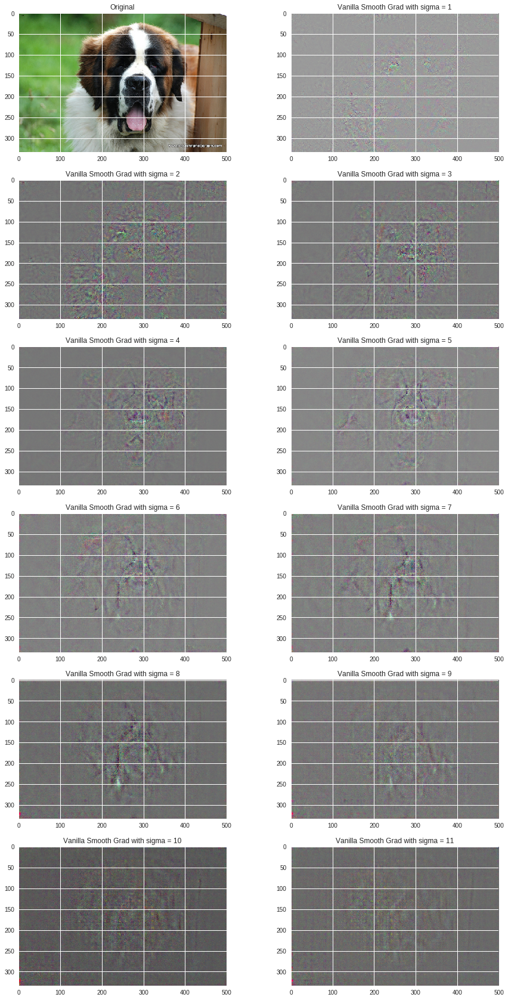

In [67]:
fig,ax = plt.subplots(6,2,figsize=(15,30))
ax[0,0].imshow(original_image)
ax[0,0].set_title('Original')
ax[0,1].imshow(arr_to_img(results[1]))
ax[1,0].imshow(arr_to_img(results[2]))
ax[1,1].imshow(arr_to_img(results[3]))
ax[2,0].imshow(arr_to_img(results[4]))
ax[2,1].imshow(arr_to_img(results[5]))
ax[3,0].imshow(arr_to_img(results[6]))
ax[3,1].imshow(arr_to_img(results[7]))
ax[4,0].imshow(arr_to_img(results[8]))
ax[4,1].imshow(arr_to_img(results[9]))
ax[5,0].imshow(arr_to_img(results[10]))
ax[5,1].imshow(arr_to_img(results[11]))
ax[0,1].set_title('Vanilla Smooth Grad with sigma = 1')
ax[1,0].set_title('Vanilla Smooth Grad with sigma = 2')
ax[1,1].set_title('Vanilla Smooth Grad with sigma = 3')
ax[2,0].set_title('Vanilla Smooth Grad with sigma = 4')
ax[2,1].set_title('Vanilla Smooth Grad with sigma = 5')
ax[3,0].set_title('Vanilla Smooth Grad with sigma = 6')
ax[3,1].set_title('Vanilla Smooth Grad with sigma = 7')
ax[4,0].set_title('Vanilla Smooth Grad with sigma = 8')
ax[4,1].set_title('Vanilla Smooth Grad with sigma = 9')
ax[5,0].set_title('Vanilla Smooth Grad with sigma = 10')
ax[5,1].set_title('Vanilla Smooth Grad with sigma = 11');

In [68]:
results4 = {}
for i in range(1,12):
  print(i)
  pretrained_model = copy.deepcopy(learn.model).cpu()
  GBP = GuidedBackprop(pretrained_model) 
  param_n = 50
  param_sigma_multiplier = i
  smooth_grad = generate_smooth_grad(GBP,  # ^This parameter
                                     prep_img,
                                     target_class,
                                     param_n,
                                     param_sigma_multiplier)
  results4[i] = smooth_grad

1
Iteration 0 of 50 started
Iteration 10 of 50 started
Iteration 20 of 50 started
Iteration 30 of 50 started
Iteration 40 of 50 started
2
Iteration 0 of 50 started
Iteration 10 of 50 started
Iteration 20 of 50 started
Iteration 30 of 50 started
Iteration 40 of 50 started
3
Iteration 0 of 50 started
Iteration 10 of 50 started
Iteration 20 of 50 started
Iteration 30 of 50 started
Iteration 40 of 50 started
4
Iteration 0 of 50 started
Iteration 10 of 50 started
Iteration 20 of 50 started
Iteration 30 of 50 started
Iteration 40 of 50 started
5
Iteration 0 of 50 started
Iteration 10 of 50 started
Iteration 20 of 50 started
Iteration 30 of 50 started
Iteration 40 of 50 started
6
Iteration 0 of 50 started
Iteration 10 of 50 started
Iteration 20 of 50 started
Iteration 30 of 50 started
Iteration 40 of 50 started
7
Iteration 0 of 50 started
Iteration 10 of 50 started
Iteration 20 of 50 started
Iteration 30 of 50 started
Iteration 40 of 50 started
8
Iteration 0 of 50 started
Iteration 10 of 50 s

[autoreload of guided_backprop failed: Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/IPython/extensions/autoreload.py", line 247, in check
    superreload(m, reload, self.old_objects)
AttributeError: 'NoneType' object has no attribute 'name'
]
[autoreload of misc_functions failed: Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/IPython/extensions/autoreload.py", line 247, in check
    superreload(m, reload, self.old_objects)
AttributeError: 'NoneType' object has no attribute 'name'
]
[autoreload of vanilla_backprop failed: Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/IPython/extensions/autoreload.py", line 247, in check
    superreload(m, reload, self.old_objects)
AttributeError: 'NoneType' object has no attribute 'name'
]
[autoreload of generate_class_specific_samples failed: Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/IPython/extensions/auto

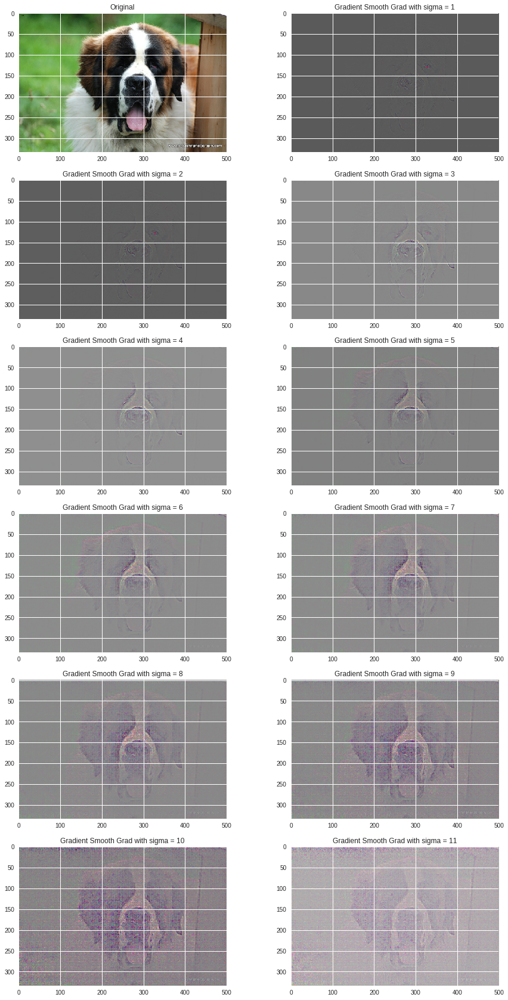

In [69]:
fig,ax = plt.subplots(6,2,figsize=(15,30))
ax[0,0].imshow(original_image)
ax[0,0].set_title('Original')
ax[0,1].imshow(arr_to_img(results4[1]))
ax[1,0].imshow(arr_to_img(results4[2]))
ax[1,1].imshow(arr_to_img(results4[3]))
ax[2,0].imshow(arr_to_img(results4[4]))
ax[2,1].imshow(arr_to_img(results4[5]))
ax[3,0].imshow(arr_to_img(results4[6]))
ax[3,1].imshow(arr_to_img(results4[7]))
ax[4,0].imshow(arr_to_img(results4[8]))
ax[4,1].imshow(arr_to_img(results4[9]))
ax[5,0].imshow(arr_to_img(results4[10]))
ax[5,1].imshow(arr_to_img(results4[11]))
ax[0,1].set_title('Gradient Smooth Grad with sigma = 1')
ax[1,0].set_title('Gradient Smooth Grad with sigma = 2')
ax[1,1].set_title('Gradient Smooth Grad with sigma = 3')
ax[2,0].set_title('Gradient Smooth Grad with sigma = 4')
ax[2,1].set_title('Gradient Smooth Grad with sigma = 5')
ax[3,0].set_title('Gradient Smooth Grad with sigma = 6')
ax[3,1].set_title('Gradient Smooth Grad with sigma = 7')
ax[4,0].set_title('Gradient Smooth Grad with sigma = 8')
ax[4,1].set_title('Gradient Smooth Grad with sigma = 9')
ax[5,0].set_title('Gradient Smooth Grad with sigma = 10')
ax[5,1].set_title('Gradient Smooth Grad with sigma = 11');

# Filter at different layers Viz

In [0]:
from cnn_layer_visualization import *

In [0]:
for i in range(1,7):
  pretrained_model = copy.deepcopy(learn.model).cpu()
  layer_vis = CNNLayerVisualization(pretrained_model, 0, int(i**2.3),mean,std)

  # Generate layer list
  layers = layer_vis.create_layer_list()

  # Layer visualization with pytorch hooks
  layer_vis.visualise_layer_with_hooks(iterations = 50)

Iteration: 10 Loss: -8.73
Iteration: 20 Loss: -18.45
Iteration: 30 Loss: -28.12
Iteration: 40 Loss: -37.74
Iteration: 50 Loss: -47.29
Iteration: 10 Loss: -0.34
Iteration: 20 Loss: -1.81
Iteration: 30 Loss: -3.22
Iteration: 40 Loss: -4.57
Iteration: 50 Loss: -5.84
Iteration: 10 Loss: -1.07
Iteration: 20 Loss: -5.08
Iteration: 30 Loss: -9.04
Iteration: 40 Loss: -12.94
Iteration: 50 Loss: -16.76
Iteration: 10 Loss: -9.45
Iteration: 20 Loss: -18.36
Iteration: 30 Loss: -27.23
Iteration: 40 Loss: -36.03
Iteration: 50 Loss: -44.77
Iteration: 10 Loss: -6.28
Iteration: 20 Loss: -13.26
Iteration: 30 Loss: -20.20
Iteration: 40 Loss: -27.08
Iteration: 50 Loss: -33.90
Iteration: 10 Loss: -0.53
Iteration: 20 Loss: -1.07
Iteration: 30 Loss: -1.53
Iteration: 40 Loss: -1.90
Iteration: 50 Loss: -2.19


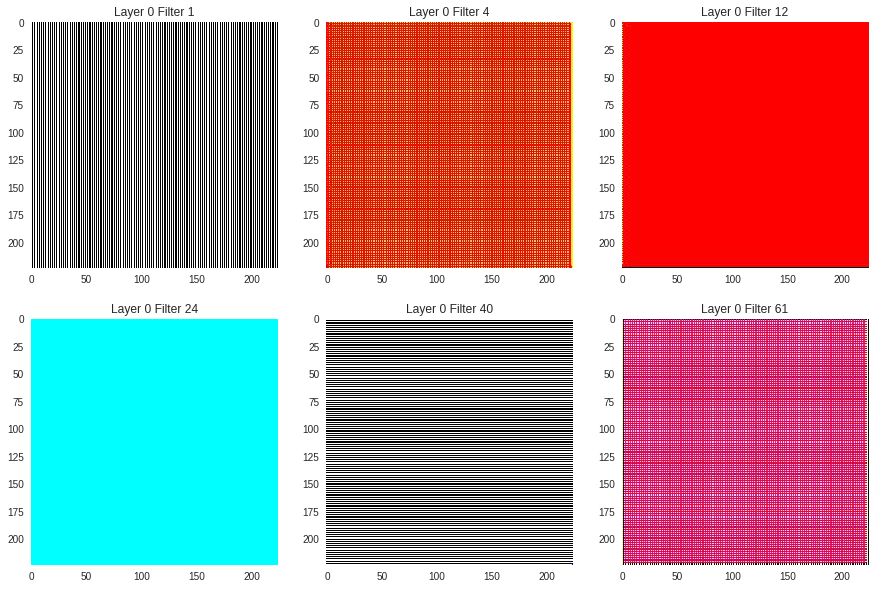

In [0]:
fig,ax = plt.subplots(2,3,figsize=(15,10))

for i in range(ax.shape[0]*ax.shape[1] ):
  im = Image.open(f'../generated/layer_vis_l0_f{int((i+1)**2.3)}_iter50.jpg')

  ax[i//ax.shape[1],i % ax.shape[1]].imshow(im)
  ax[i//ax.shape[1],i % ax.shape[1]].set_title(f'Layer 0 Filter {int((i+1)**2.3)}')
  ax[i//ax.shape[1],i % ax.shape[1]].grid(None)


In [0]:
for idx,lay in enumerate(layers):
  print(idx,lay)

0 Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
1 BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
2 ReLU(inplace)
3 MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
4 Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
5 BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
6 ReLU(inplace)
7 Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
8 BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
9 Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
10 BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
11 ReLU(inplace)
12 Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
13 BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
14 Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(

In [0]:
def make_layer_viz(lay_n, n_iter=50):
  for i in range(1,7):
    print(f'Filter {i}')
    pretrained_model = copy.deepcopy(learn.model).cpu()
    layer_vis = CNNLayerVisualization(pretrained_model, lay_n, int(i**2.3),mean,std)

    # Generate layer list
    layers = layer_vis.create_layer_list()

    # Layer visualization with pytorch hooks
    layer_vis.visualise_layer_with_hooks(iterations = n_iter)
    
  fig,ax = plt.subplots(2,3,figsize=(15,10))

  for i in range(ax.shape[0]*ax.shape[1] ):
    im = Image.open(f'../generated/layer_vis_l{lay_n}_f{int((i+1)**2.3)}_iter{n_iter}.jpg')

    ax[i//ax.shape[1],i % ax.shape[1]].imshow(im)
    ax[i//ax.shape[1],i % ax.shape[1]].set_title(f'Layer {lay_n} Filter {int((i+1)**2.3)}')
    ax[i//ax.shape[1],i % ax.shape[1]].grid(None)


Filter 1
Iteration: 10 Loss: -1.39
Iteration: 20 Loss: -3.35
Iteration: 30 Loss: -5.40
Iteration: 40 Loss: -7.50
Iteration: 50 Loss: -9.58
Filter 2
Iteration: 10 Loss: -0.28
Iteration: 20 Loss: -1.27
Iteration: 30 Loss: -2.27
Iteration: 40 Loss: -3.27
Iteration: 50 Loss: -4.23
Filter 3
Iteration: 10 Loss: -4.00
Iteration: 20 Loss: -7.41
Iteration: 30 Loss: -10.81
Iteration: 40 Loss: -14.21
Iteration: 50 Loss: -17.58
Filter 4
Iteration: 10 Loss: -3.46
Iteration: 20 Loss: -6.94
Iteration: 30 Loss: -10.57
Iteration: 40 Loss: -14.28
Iteration: 50 Loss: -18.02
Filter 5
Iteration: 10 Loss: 0.79
Iteration: 20 Loss: 0.32
Iteration: 30 Loss: -0.12
Iteration: 40 Loss: -0.56
Iteration: 50 Loss: -1.01
Filter 6
Iteration: 10 Loss: 0.65
Iteration: 20 Loss: -0.30
Iteration: 30 Loss: -1.28
Iteration: 40 Loss: -2.27
Iteration: 50 Loss: -3.27


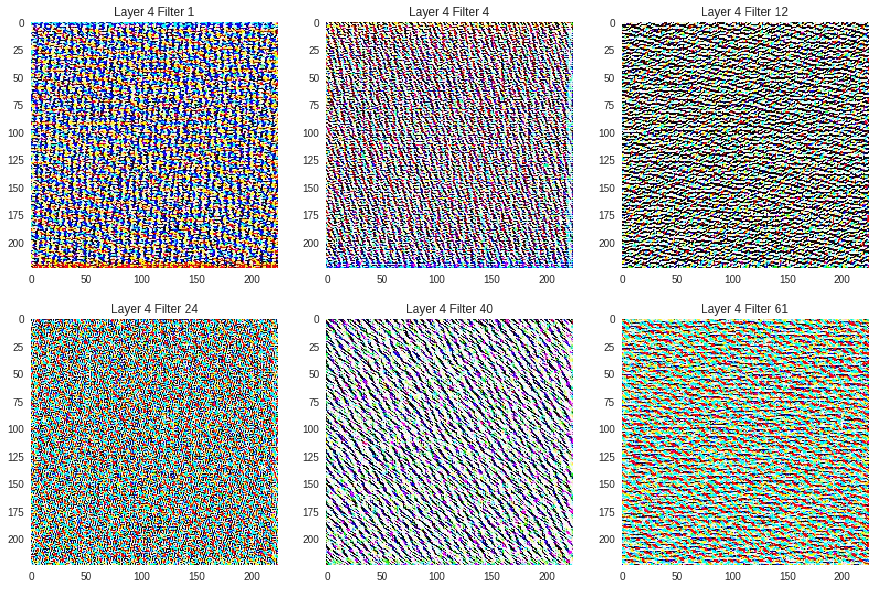

In [0]:
make_layer_viz(4)

Filter 1
Iteration: 10 Loss: -1.18
Iteration: 20 Loss: -1.74
Iteration: 30 Loss: -2.12
Iteration: 40 Loss: -2.45
Iteration: 50 Loss: -2.78
Filter 2
Iteration: 10 Loss: -0.32
Iteration: 20 Loss: -0.82
Iteration: 30 Loss: -1.42
Iteration: 40 Loss: -2.12
Iteration: 50 Loss: -2.86
Filter 3
Iteration: 10 Loss: -0.87
Iteration: 20 Loss: -1.13
Iteration: 30 Loss: -1.32
Iteration: 40 Loss: -1.51
Iteration: 50 Loss: -1.68
Filter 4
Iteration: 10 Loss: -2.28
Iteration: 20 Loss: -3.74
Iteration: 30 Loss: -5.19
Iteration: 40 Loss: -6.68
Iteration: 50 Loss: -8.22
Filter 5
Iteration: 10 Loss: -0.30
Iteration: 20 Loss: -0.46
Iteration: 30 Loss: -0.58
Iteration: 40 Loss: -0.70
Iteration: 50 Loss: -0.86
Filter 6
Iteration: 10 Loss: -0.60
Iteration: 20 Loss: -0.94
Iteration: 30 Loss: -1.35
Iteration: 40 Loss: -1.90
Iteration: 50 Loss: -2.49


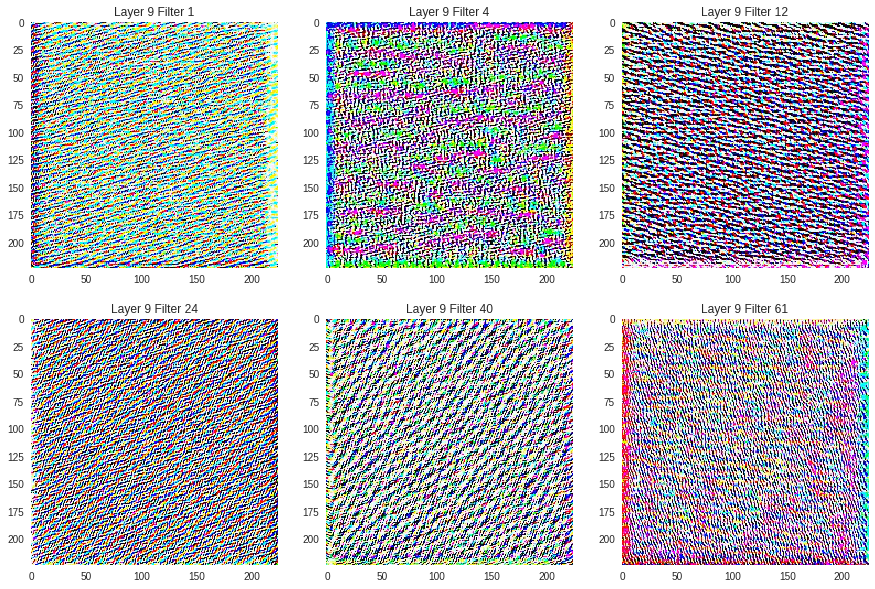

In [0]:
make_layer_viz(9)

Filter 1
Iteration: 10 Loss: 0.39
Iteration: 20 Loss: 0.13
Iteration: 30 Loss: -0.14
Iteration: 40 Loss: -0.41
Iteration: 50 Loss: -0.71
Filter 2
Iteration: 10 Loss: -0.06
Iteration: 20 Loss: -0.18
Iteration: 30 Loss: -0.28
Iteration: 40 Loss: -0.37
Iteration: 50 Loss: -0.47
Filter 3
Iteration: 10 Loss: -0.25
Iteration: 20 Loss: -0.31
Iteration: 30 Loss: -0.36
Iteration: 40 Loss: -0.42
Iteration: 50 Loss: -0.49
Filter 4
Iteration: 10 Loss: 0.04
Iteration: 20 Loss: 0.03
Iteration: 30 Loss: 0.02
Iteration: 40 Loss: 0.02
Iteration: 50 Loss: 0.01
Filter 5
Iteration: 10 Loss: -0.70
Iteration: 20 Loss: -0.91
Iteration: 30 Loss: -1.04
Iteration: 40 Loss: -1.15
Iteration: 50 Loss: -1.26
Filter 6
Iteration: 10 Loss: -0.74
Iteration: 20 Loss: -0.94
Iteration: 30 Loss: -1.13
Iteration: 40 Loss: -1.32
Iteration: 50 Loss: -1.51


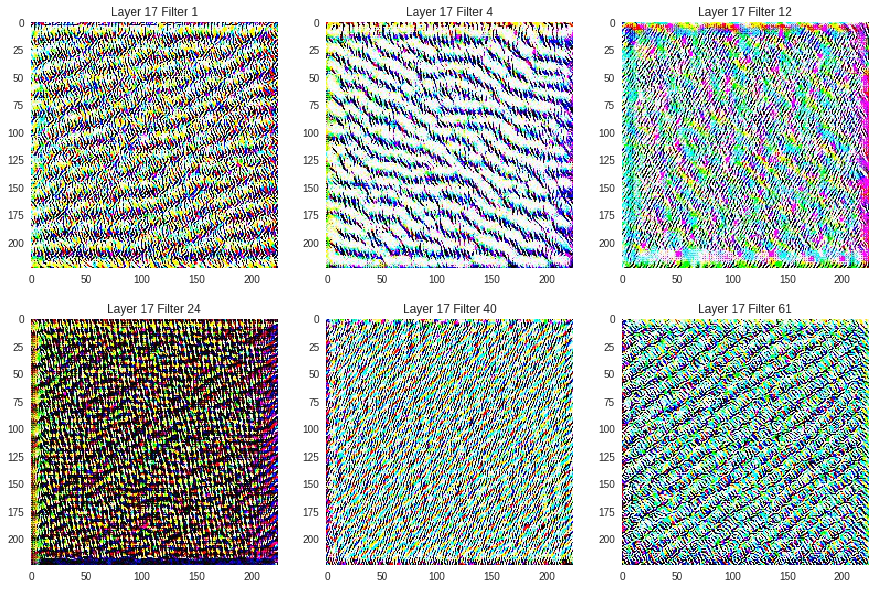

In [0]:
make_layer_viz(17)

Filter 1
Iteration: 10 Loss: -0.56
Iteration: 20 Loss: -1.03
Iteration: 30 Loss: -1.44
Iteration: 40 Loss: -1.84
Iteration: 50 Loss: -2.22
Filter 2
Iteration: 10 Loss: -0.64
Iteration: 20 Loss: -0.78
Iteration: 30 Loss: -0.88
Iteration: 40 Loss: -0.96
Iteration: 50 Loss: -1.03
Filter 3
Iteration: 10 Loss: 0.03
Iteration: 20 Loss: 0.00
Iteration: 30 Loss: -0.01
Iteration: 40 Loss: -0.02
Iteration: 50 Loss: -0.03
Filter 4
Iteration: 10 Loss: 0.03
Iteration: 20 Loss: -0.02
Iteration: 30 Loss: -0.05
Iteration: 40 Loss: -0.07
Iteration: 50 Loss: -0.08
Filter 5
Iteration: 10 Loss: -1.08
Iteration: 20 Loss: -1.54
Iteration: 30 Loss: -1.97
Iteration: 40 Loss: -2.39
Iteration: 50 Loss: -2.82
Filter 6
Iteration: 10 Loss: -0.53
Iteration: 20 Loss: -0.92
Iteration: 30 Loss: -1.25
Iteration: 40 Loss: -1.52
Iteration: 50 Loss: -1.74


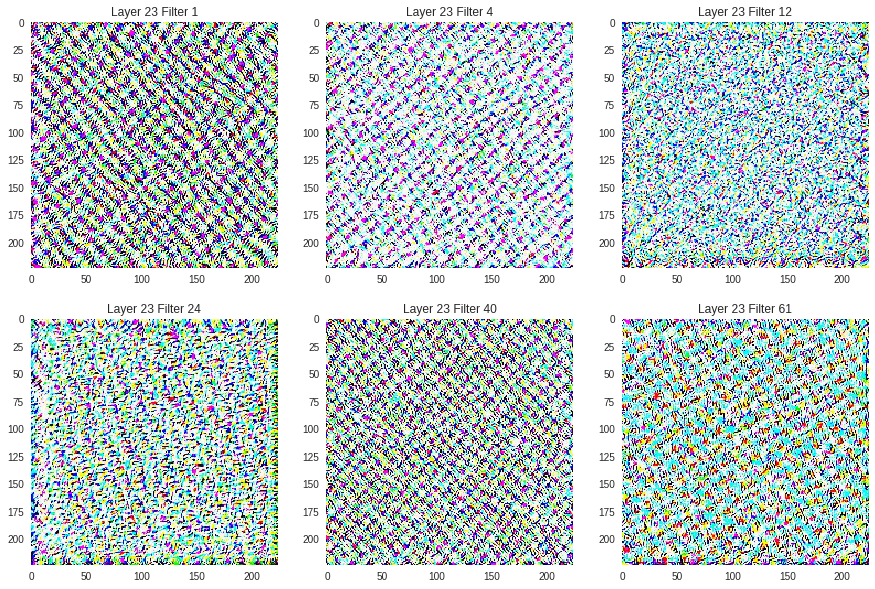

In [0]:
make_layer_viz(23)

Filter 1
Iteration: 10 Loss: -0.58
Iteration: 20 Loss: -1.13
Iteration: 30 Loss: -1.73
Iteration: 40 Loss: -2.32
Iteration: 50 Loss: -2.91
Filter 2
Iteration: 10 Loss: -2.14
Iteration: 20 Loss: -2.99
Iteration: 30 Loss: -3.58
Iteration: 40 Loss: -4.10
Iteration: 50 Loss: -4.62
Filter 3
Iteration: 10 Loss: -0.79
Iteration: 20 Loss: -1.19
Iteration: 30 Loss: -1.52
Iteration: 40 Loss: -1.85
Iteration: 50 Loss: -2.20
Filter 4
Iteration: 10 Loss: -1.37
Iteration: 20 Loss: -2.62
Iteration: 30 Loss: -3.88
Iteration: 40 Loss: -5.16
Iteration: 50 Loss: -6.47
Filter 5
Iteration: 10 Loss: -1.98
Iteration: 20 Loss: -3.31
Iteration: 30 Loss: -4.62
Iteration: 40 Loss: -6.03
Iteration: 50 Loss: -7.54
Filter 6
Iteration: 10 Loss: -4.48
Iteration: 20 Loss: -10.91
Iteration: 30 Loss: -16.77
Iteration: 40 Loss: -22.45
Iteration: 50 Loss: -28.13


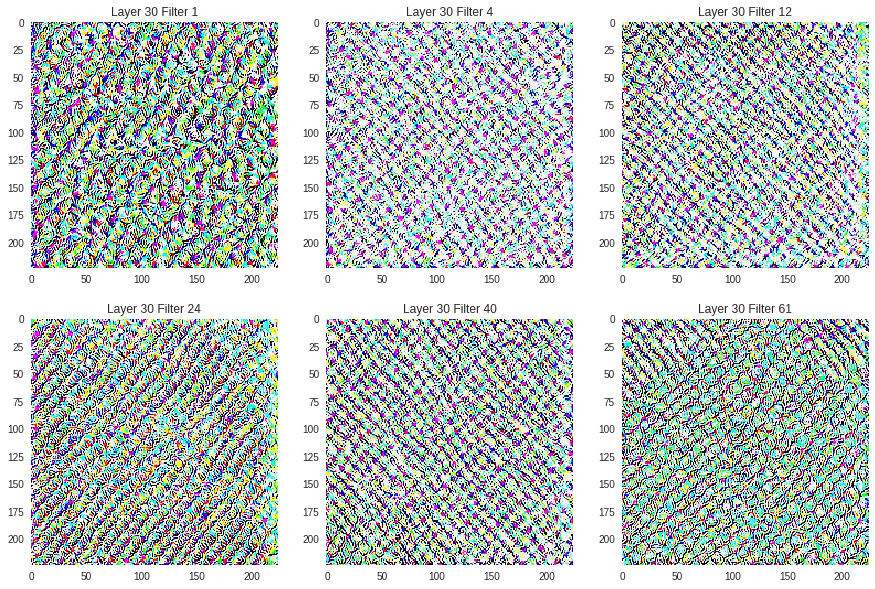

In [0]:
make_layer_viz(30)

Filter 1
Iteration: 10 Loss: -111.24
Iteration: 20 Loss: -237.74
Iteration: 30 Loss: -359.46
Iteration: 40 Loss: -481.26
Iteration: 50 Loss: -608.01
Filter 2
Iteration: 10 Loss: -525.65
Iteration: 20 Loss: -1093.79
Iteration: 30 Loss: -1643.07
Iteration: 40 Loss: -2200.77
Iteration: 50 Loss: -2782.23
Filter 3
Iteration: 10 Loss: -517.64
Iteration: 20 Loss: -992.20
Iteration: 30 Loss: -1486.33
Iteration: 40 Loss: -2007.66
Iteration: 50 Loss: -2549.04
Filter 4
Iteration: 10 Loss: -214.81
Iteration: 20 Loss: -475.86
Iteration: 30 Loss: -744.41
Iteration: 40 Loss: -1019.02
Iteration: 50 Loss: -1302.12
Filter 5
Iteration: 10 Loss: -636.69
Iteration: 20 Loss: -1347.80
Iteration: 30 Loss: -2058.13
Iteration: 40 Loss: -2790.28
Iteration: 50 Loss: -3552.44
Filter 6
Iteration: 10 Loss: -495.76
Iteration: 20 Loss: -1038.01
Iteration: 30 Loss: -1557.88
Iteration: 40 Loss: -2085.15
Iteration: 50 Loss: -2630.89


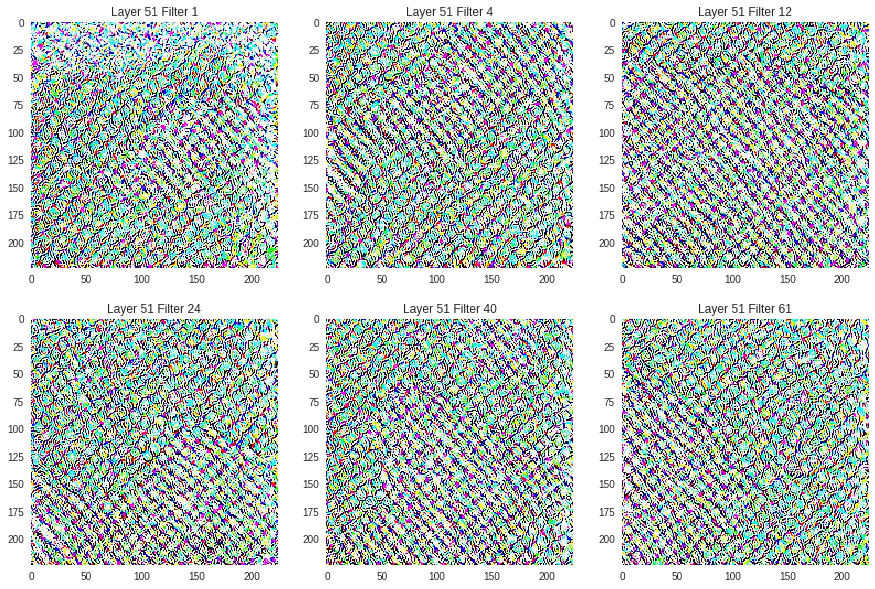

In [0]:
make_layer_viz(51)

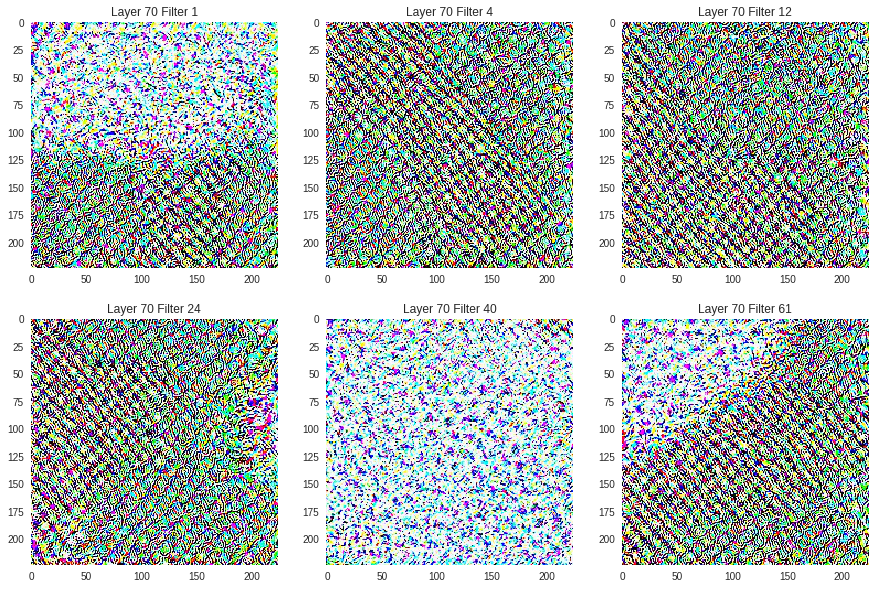

In [82]:
make_layer_viz(70,150)